In [ ]:
import cv2

def video_to_images(video_path, output_folder):

    video_capture = cv2.VideoCapture(video_path)

    import os
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    success, frame = video_capture.read()
    count = 0
    while success:

        image_path = os.path.join(output_folder, f"frame_{count}.jpg")
        cv2.imwrite(image_path, frame)


        success, frame = video_capture.read()
        count += 1


    video_capture.release()


video_path = '/content/drive/MyDrive/Fluid Proj/3CYL_Flow.mp4'
output_folder = '/content/drive/MyDrive/Fluid Proj/Imagestack2'

video_to_images(video_path, output_folder)


<ipython-input-14-1293f690c0a0>:24: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((image_width, hsize), Image.ANTIALIAS)


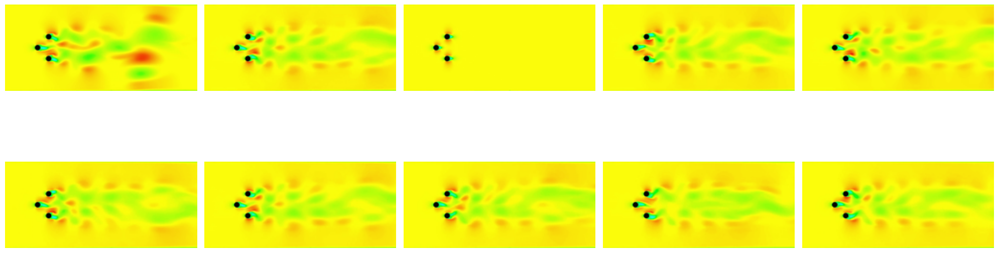

In [ ]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

def print_random_images(folder_path, num_images=5, image_width=200):
    files = os.listdir(folder_path)
    image_files = [f for f in files if f.endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp'))]
    if not image_files:
        print("No image files found in the folder.")
        return
    num_images = min(num_images, len(image_files))
    selected_indices = random.sample(range(len(image_files)), num_images)
    num_rows = (num_images + 4) // 5
    fig, axes = plt.subplots(num_rows, 5, figsize=(20, 4 * num_rows))
    axes = axes.flatten()
    for i, idx in enumerate(selected_indices):
        image_file = image_files[idx]
        try:
            img_path = os.path.join(folder_path, image_file)
            img = Image.open(img_path)
            wpercent = (image_width / float(img.size[0]))
            hsize = int((float(img.size[1]) * float(wpercent)))
            img = img.resize((image_width, hsize), Image.ANTIALIAS)
            axes[i].imshow(img)
            axes[i].axis('off')
            # axes[i].set_title(image_file)
        except Exception as e:
            print(f"Error displaying {image_file}: {e}")
    plt.tight_layout()
    plt.show()

folder_path = "/content/drive/MyDrive/Fluid Proj/Imagestack2"
num_images_to_print = 10
image_width = 200
print_random_images(folder_path, num_images_to_print, image_width)


In [ ]:
from PIL import Image
import numpy as np
import os

def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        if os.path.isfile(img_path):
            try:
                img = Image.open(img_path)
                img_gray = img.convert('L')
                img_array = np.array(img_gray)
                images.append(img_array)
            except:
                print(f"Failed to load image: {img_path}")
    return images

folder_path = "/content/drive/MyDrive/Fluid Proj/Imagestack2"
image_array = load_images_from_folder(folder_path)



In [ ]:
import numpy as np
import cv2
import os

def read_images(folder):
    images = []
    for filename in sorted(os.listdir(folder)):
        img = cv2.imread(os.path.join(folder, filename), cv2.IMREAD_GRAYSCALE)
        if img is not None:
            images.append(img.flatten())
    return np.array(images)

def compute_mean(images):
    return np.mean(images, axis=0)

def compute_fluctuation_matrix(images, mean_image):
    return images - mean_image

def perform_svd(fluctuation_matrix):
    U, S, Vt = np.linalg.svd(fluctuation_matrix, full_matrices=False)
    return U, S, Vt



images_folder = '/content/drive/MyDrive/Fluid Proj/Imagestack2'
output_folder = '/content/drive/MyDrive/Fluid Proj/SVD_output'
batch_size = 100
modes = 10

images = read_images(images_folder)

mean_image = compute_mean(images)

num_batches = len(images) // batch_size + 1
for batch_idx in range(num_batches):
    start_idx = batch_idx * batch_size
    end_idx = min((batch_idx + 1) * batch_size, len(images))
    batch_images = images[start_idx:end_idx]

    if len(batch_images) == 0:
        break

    fluctuation_matrix = compute_fluctuation_matrix(batch_images, mean_image)

    U, S, Vt = perform_svd(fluctuation_matrix)


print("Printing top 10 energy states modes completed!")


Printing top 10 energy states modes completed!


In [ ]:
def reconstruct_images(U, S, Vt, modes):
    reconstructed_images  = U @ S @ Vt + compute_mean(images)
    return reconstructed_images

In [ ]:
    S_new = np.zeros((51,51))
    np.fill_diagonal(S_new, S)
    reconstructed_images = reconstruct_images(U, S_new, Vt, modes)

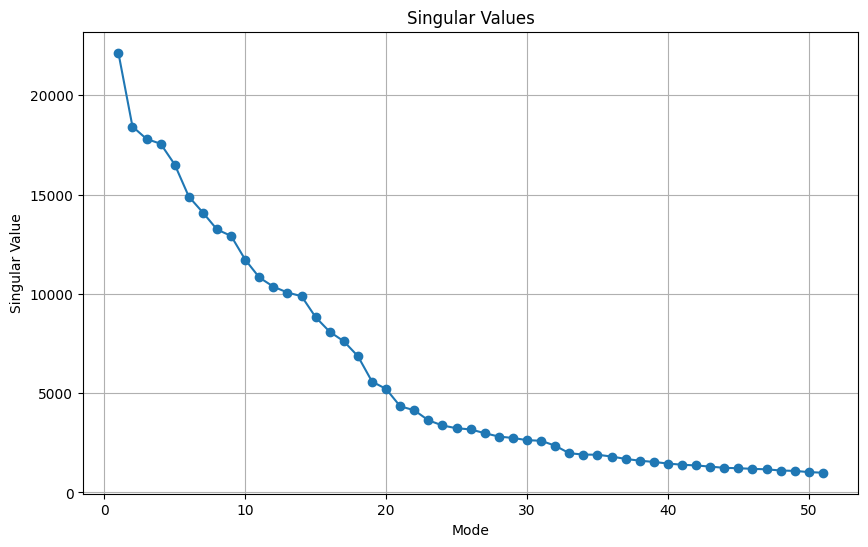

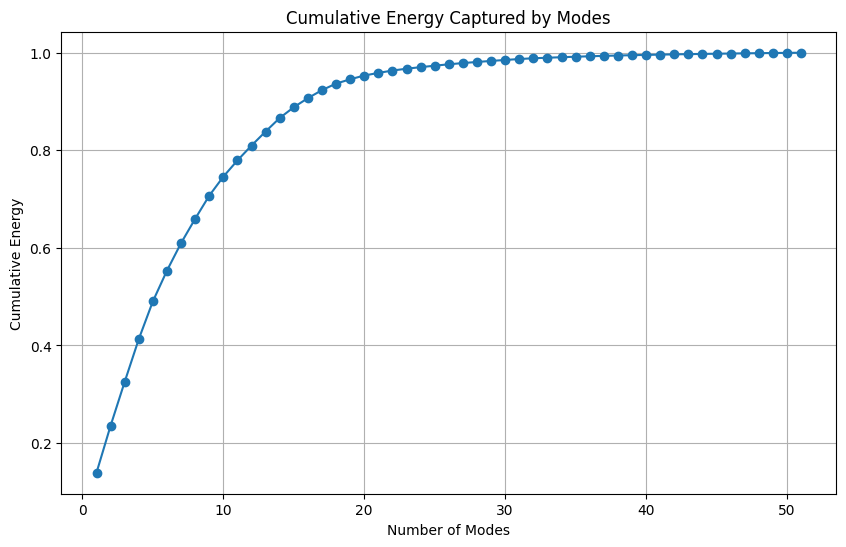

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

singular_values = S

plt.figure(figsize=(10, 6))
plt.plot(np.arange(1, len(singular_values) + 1), singular_values, marker='o', linestyle='-')
plt.title('Singular Values')
plt.xlabel('Mode')
plt.ylabel('Singular Value')
plt.grid(True)
plt.show()

cumulative_energy = np.cumsum(singular_values ** 2 / np.sum(singular_values ** 2))

plt.figure(figsize=(10, 6))
plt.plot(np.arange(1, len(cumulative_energy) + 1), cumulative_energy, marker='o', linestyle='-')
plt.title('Cumulative Energy Captured by Modes')
plt.xlabel('Number of Modes')
plt.ylabel('Cumulative Energy')
plt.grid(True)
plt.show()

top_modes_indices = np.argsort(singular_values)[::-1][:10]
top_modes_energy = singular_values


In [ ]:
print("Top 10 energy states (modes):")
for mode, energy in zip(top_modes_indices, top_modes_energy):
    print(f"Mode {mode + 1}: Energy = {round(energy,4)}")

Top 10 energy states (modes):
Mode 1: Energy = 22140.7194
Mode 2: Energy = 18423.8024
Mode 3: Energy = 17798.6318
Mode 4: Energy = 17555.6327
Mode 5: Energy = 16508.8169
Mode 6: Energy = 14893.5741
Mode 7: Energy = 14091.2135
Mode 8: Energy = 13240.4198
Mode 9: Energy = 12916.0046
Mode 10: Energy = 11721.0856


In [ ]:
images[0].shape

(1103064,)

In [ ]:
reconstructed_images.shape

(51, 1103064)

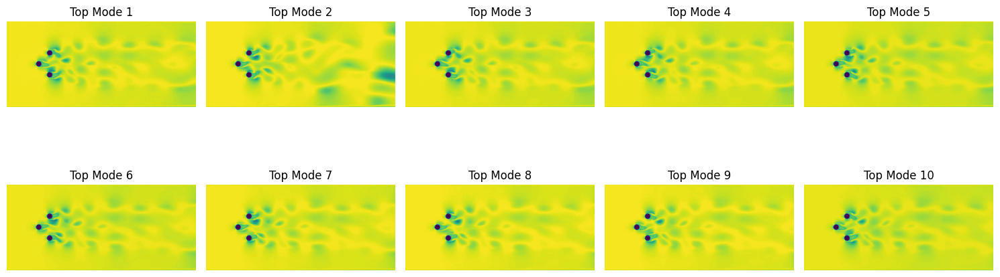

In [ ]:
import matplotlib.pyplot as plt

# Plot the top 10 reconstructed images
plt.figure(figsize=(15, 6))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(reconstructed_images[i].reshape(image_array[0].shape), cmap=None)
    plt.title(f"Top Mode {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import cv2
import os

def read_images(folder):
    images = []
    for filename in sorted(os.listdir(folder)):
        img = cv2.imread(os.path.join(folder, filename), cv2.IMREAD_GRAYSCALE)
        if img is not None:
            images.append(img)
    return images

def add_gaussian_noise(image, magnitude):
    mean = 0
    sigma = magnitude * np.max(image) / 5
    noise = np.random.normal(mean, sigma, image.shape)
    noisy_image = image + noise
    noisy_image = np.clip(noisy_image, 0, 255).astype(np.uint8)
    return noisy_image





images_folder = '/content/drive/MyDrive/Fluid Proj/Imagestack2'
output_folder = '/content/drive/MyDrive/Fluid Proj/Noisy_Images_Gaussian'

original_images = read_images(images_folder)

noise_magnitudes = [0.2, 0.4, 0.6, 0.8]
noise_types = ['Gaussian']

for noise_type in noise_types:
    for magnitude in noise_magnitudes:
        for idx, image in enumerate(original_images):
            if noise_type == 'Gaussian':
                noisy_image = add_gaussian_noise(image, magnitude)

            output_filename = f'{noise_type}_Noise_{int(magnitude*100)}_{idx+1}.png'
            cv2.imwrite(os.path.join(output_folder, output_filename), noisy_image)

print("Noise addition completed!")


Noise addition completed!


In [ ]:
from PIL import Image
import numpy as np
import os

def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        if os.path.isfile(img_path):
            try:
                img = Image.open(img_path)
                img_gray = img.convert('L')
                img_array = np.array(img_gray)
                images.append(img_array)
            except:
                print(f"Failed to load image: {img_path}")
    return images

folder_path = "/content/drive/MyDrive/Fluid Proj/New_Noise_Gaussian_20"
image_array = load_images_from_folder(folder_path)

In [ ]:
import numpy as np
import cv2
import os

def read_images(folder):
    images = []
    for filename in sorted(os.listdir(folder)):
        img = cv2.imread(os.path.join(folder, filename), cv2.IMREAD_GRAYSCALE)
        if img is not None:
            images.append(img.flatten())
    return np.array(images)

def compute_mean(images):
    return np.mean(images, axis=0)

def compute_fluctuation_matrix(images, mean_image):
    return images - mean_image

def perform_svd(fluctuation_matrix):
    U, S, Vt = np.linalg.svd(fluctuation_matrix, full_matrices=False)
    return U, S, Vt



images_folder = '/content/drive/MyDrive/Fluid Proj/New_Noise_Gaussian_20'
batch_size = 100
modes = 10

images = read_images(images_folder)

mean_image = compute_mean(images)

num_batches = len(images) // batch_size + 1
for batch_idx in range(num_batches):
    start_idx = batch_idx * batch_size
    end_idx = min((batch_idx + 1) * batch_size, len(images))
    batch_images = images[start_idx:end_idx]

    if len(batch_images) == 0:
        break

    fluctuation_matrix = compute_fluctuation_matrix(batch_images, mean_image)

    U, S, Vt = perform_svd(fluctuation_matrix)


print("Applying Svd on Gaussian 20 % Noise completed!")

Applying Svd on Gaussian 20 % Noise completed!


In [ ]:
def reconstruct_images(U, S, Vt, modes):
    reconstructed_images  = U @ S @ Vt + compute_mean(images)
    return reconstructed_images

S_new = np.zeros((100,100))
np.fill_diagonal(S_new, S)
reconstructed_images = reconstruct_images(U, S_new, Vt, modes)

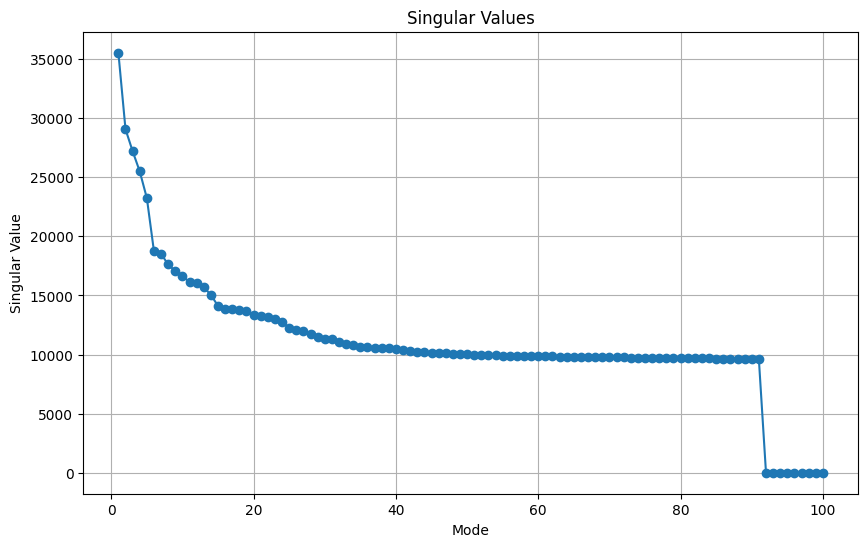

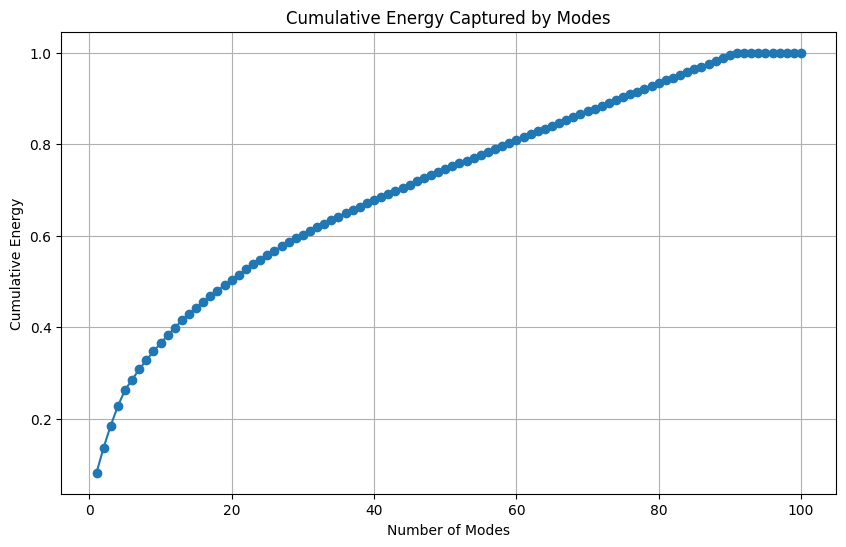

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

singular_values = S

plt.figure(figsize=(10, 6))
plt.plot(np.arange(1, len(singular_values) + 1), singular_values, marker='o', linestyle='-')
plt.title('Singular Values')
plt.xlabel('Mode')
plt.ylabel('Singular Value')
plt.grid(True)
plt.show()

cumulative_energy = np.cumsum(singular_values ** 2 / np.sum(singular_values ** 2))

plt.figure(figsize=(10, 6))
plt.plot(np.arange(1, len(cumulative_energy) + 1), cumulative_energy, marker='o', linestyle='-')
plt.title('Cumulative Energy Captured by Modes')
plt.xlabel('Number of Modes')
plt.ylabel('Cumulative Energy')
plt.grid(True)
plt.show()

top_modes_indices = np.argsort(singular_values)[::-1][:10]
top_modes_energy = singular_values

In [ ]:
print("Top 10 energy states (modes):")
for mode, energy in zip(top_modes_indices, top_modes_energy):
    print(f"Mode {mode + 1}: Energy = {round(energy,4)}")

Top 10 energy states (modes):
Mode 1: Energy = 35540.2249
Mode 2: Energy = 29067.7346
Mode 3: Energy = 27210.2095
Mode 4: Energy = 25501.1729
Mode 5: Energy = 23242.0419
Mode 6: Energy = 18737.0176
Mode 7: Energy = 18516.3579
Mode 8: Energy = 17620.0179
Mode 9: Energy = 17061.628
Mode 10: Energy = 16663.2591


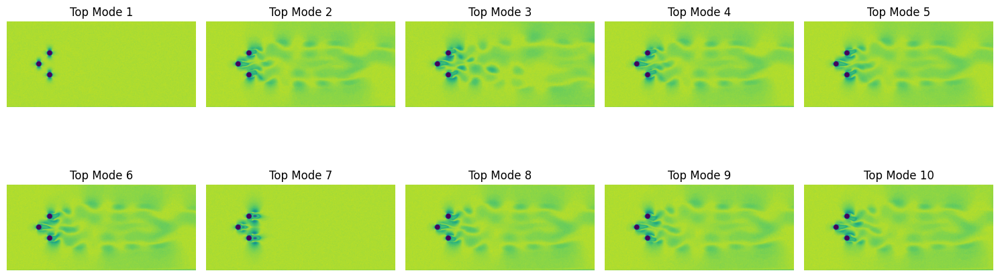

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 6))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(reconstructed_images[i].reshape(image_array[0].shape), cmap=None)
    plt.title(f"Top Mode {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
from PIL import Image
import numpy as np
import os

def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        if os.path.isfile(img_path):
            try:
                img = Image.open(img_path)
                img_gray = img.convert('L')
                img_array = np.array(img_gray)
                images.append(img_array)
            except:
                print(f"Failed to load image: {img_path}")
    return images

folder_path = "/content/drive/MyDrive/Fluid Proj/New_Noise_Gaussian_40"
image_array = load_images_from_folder(folder_path)

In [ ]:
import numpy as np
import cv2
import os

def read_images(folder):
    images = []
    for filename in sorted(os.listdir(folder)):
        img = cv2.imread(os.path.join(folder, filename), cv2.IMREAD_GRAYSCALE)
        if img is not None:
            images.append(img.flatten())
    return np.array(images)

def compute_mean(images):
    return np.mean(images, axis=0)

def compute_fluctuation_matrix(images, mean_image):
    return images - mean_image

def perform_svd(fluctuation_matrix):
    U, S, Vt = np.linalg.svd(fluctuation_matrix, full_matrices=False)
    return U, S, Vt



images_folder = '/content/drive/MyDrive/Fluid Proj/New_Noise_Gaussian_40'

batch_size = 100
modes = 10

images = read_images(images_folder)

mean_image = compute_mean(images)

num_batches = len(images) // batch_size + 1
for batch_idx in range(num_batches):
    start_idx = batch_idx * batch_size
    end_idx = min((batch_idx + 1) * batch_size, len(images))
    batch_images = images[start_idx:end_idx]

    if len(batch_images) == 0:
        break

    fluctuation_matrix = compute_fluctuation_matrix(batch_images, mean_image)

    U, S, Vt = perform_svd(fluctuation_matrix)


print("Printing top 10 energy states modes completed!")

Printing top 10 energy states modes completed!


In [ ]:
def reconstruct_images(U, S, Vt, modes):
    reconstructed_images  = U @ S @ Vt + compute_mean(images)
    return reconstructed_images

In [ ]:
S_new = np.zeros((71,71))
np.fill_diagonal(S_new, S)
reconstructed_images = reconstruct_images(U, S_new, Vt, modes)

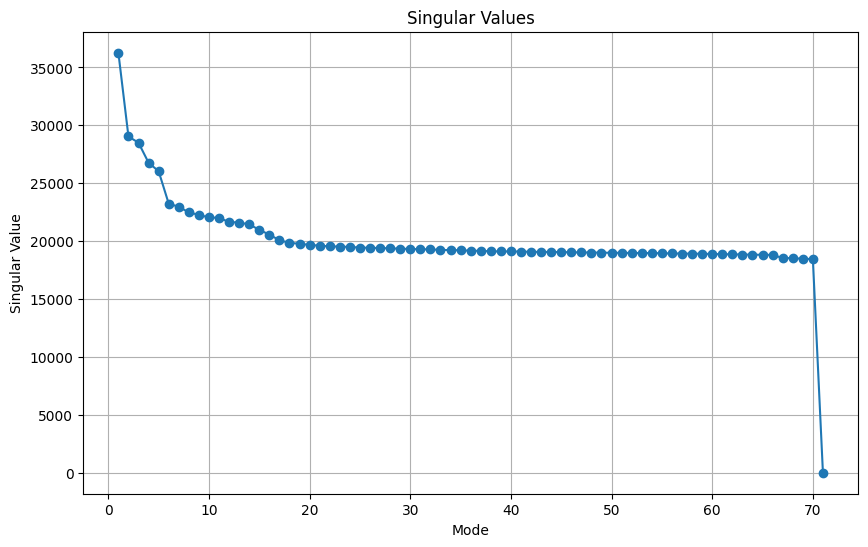

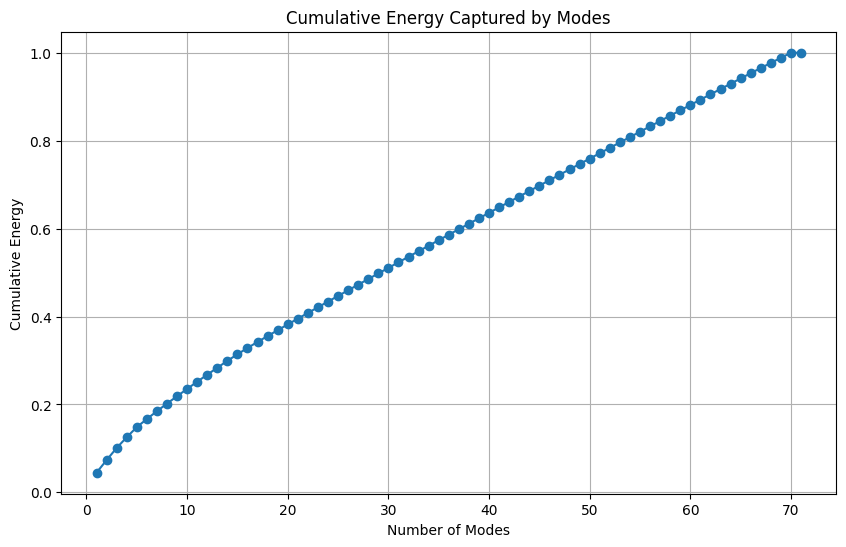

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

singular_values = S

plt.figure(figsize=(10, 6))
plt.plot(np.arange(1, len(singular_values) + 1), singular_values, marker='o', linestyle='-')
plt.title('Singular Values')
plt.xlabel('Mode')
plt.ylabel('Singular Value')
plt.grid(True)
plt.show()

cumulative_energy = np.cumsum(singular_values ** 2 / np.sum(singular_values ** 2))

plt.figure(figsize=(10, 6))
plt.plot(np.arange(1, len(cumulative_energy) + 1), cumulative_energy, marker='o', linestyle='-')
plt.title('Cumulative Energy Captured by Modes')
plt.xlabel('Number of Modes')
plt.ylabel('Cumulative Energy')
plt.grid(True)
plt.show()

top_modes_indices = np.argsort(singular_values)[::-1][:10]
top_modes_energy = singular_values

In [ ]:
print("Top 10 energy states (modes):")
for mode, energy in zip(top_modes_indices, top_modes_energy):
    print(f"Mode {mode + 1}: Energy = {round(energy,4)}")

Top 10 energy states (modes):
Mode 1: Energy = 36272.1602
Mode 2: Energy = 29040.5195
Mode 3: Energy = 28497.6292
Mode 4: Energy = 26772.6547
Mode 5: Energy = 26035.5164
Mode 6: Energy = 23240.8447
Mode 7: Energy = 22963.6293
Mode 8: Energy = 22485.3516
Mode 9: Energy = 22268.4541
Mode 10: Energy = 22047.2621


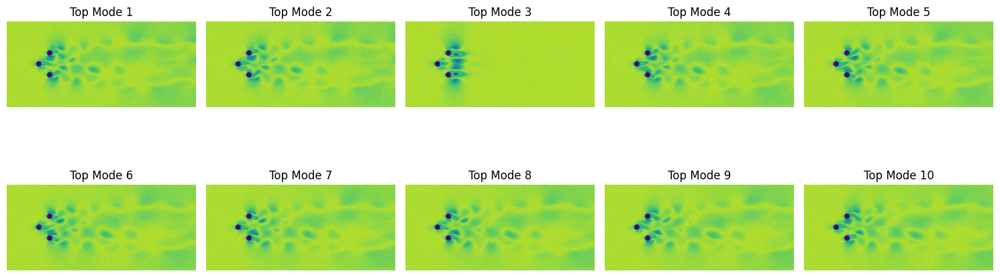

In [ ]:
import matplotlib.pyplot as plt

# Plot the top 10 reconstructed images
plt.figure(figsize=(15, 6))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(reconstructed_images[i].reshape(image_array[0].shape), cmap=None)
    plt.title(f"Top Mode {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
from PIL import Image
import numpy as np
import os

def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        if os.path.isfile(img_path):
            try:
                img = Image.open(img_path)
                img_gray = img.convert('L')
                img_array = np.array(img_gray)
                images.append(img_array)
            except:
                print(f"Failed to load image: {img_path}")
    return images

folder_path = "/content/drive/MyDrive/Fluid Proj/new_gaussian_60"
image_array = load_images_from_folder(folder_path)

In [ ]:
import numpy as np
import cv2
import os

def read_images(folder):
    images = []
    for filename in sorted(os.listdir(folder)):
        img = cv2.imread(os.path.join(folder, filename), cv2.IMREAD_GRAYSCALE)
        if img is not None:
            images.append(img.flatten())
    return np.array(images)

def compute_mean(images):
    return np.mean(images, axis=0)

def compute_fluctuation_matrix(images, mean_image):
    return images - mean_image

def perform_svd(fluctuation_matrix):
    U, S, Vt = np.linalg.svd(fluctuation_matrix, full_matrices=False)
    return U, S, Vt



images_folder = '/content/drive/MyDrive/Fluid Proj/new_gaussian_60'
batch_size = 100
modes = 10

images = read_images(images_folder)

mean_image = compute_mean(images)

num_batches = len(images) // batch_size + 1
for batch_idx in range(num_batches):
    start_idx = batch_idx * batch_size
    end_idx = min((batch_idx + 1) * batch_size, len(images))
    batch_images = images[start_idx:end_idx]

    if len(batch_images) == 0:
        break

    fluctuation_matrix = compute_fluctuation_matrix(batch_images, mean_image)

    U, S, Vt = perform_svd(fluctuation_matrix)


print("Printing top 10 energy states modes completed!")

Printing top 10 energy states modes completed!


In [ ]:
def reconstruct_images(U, S, Vt, modes):
    reconstructed_images  = U @ S @ Vt + compute_mean(images)
    return reconstructed_images

In [ ]:
S_new = np.zeros((100,100))
np.fill_diagonal(S_new, S)
reconstructed_images = reconstruct_images(U, S_new, Vt, modes)

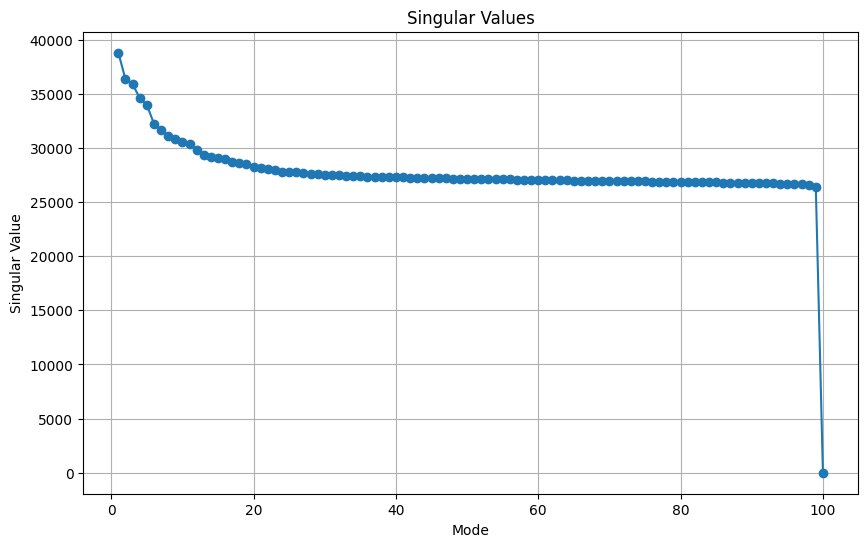

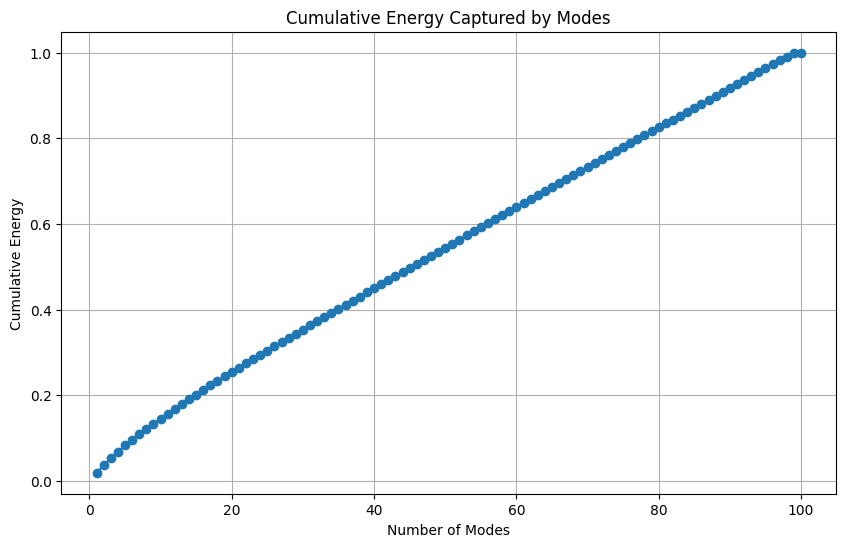

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

singular_values = S

plt.figure(figsize=(10, 6))
plt.plot(np.arange(1, len(singular_values) + 1), singular_values, marker='o', linestyle='-')
plt.title('Singular Values')
plt.xlabel('Mode')
plt.ylabel('Singular Value')
plt.grid(True)
plt.show()

cumulative_energy = np.cumsum(singular_values ** 2 / np.sum(singular_values ** 2))

plt.figure(figsize=(10, 6))
plt.plot(np.arange(1, len(cumulative_energy) + 1), cumulative_energy, marker='o', linestyle='-')
plt.title('Cumulative Energy Captured by Modes')
plt.xlabel('Number of Modes')
plt.ylabel('Cumulative Energy')
plt.grid(True)
plt.show()

top_modes_indices = np.argsort(singular_values)[::-1][:10]
top_modes_energy = singular_values

In [ ]:
print("Top 10 energy states (modes):")
for mode, energy in zip(top_modes_indices, top_modes_energy):
    print(f"Mode {mode + 1}: Energy = {round(energy,4)}")

Top 10 energy states (modes):
Mode 1: Energy = 38783.7205
Mode 2: Energy = 36313.8957
Mode 3: Energy = 35873.5429
Mode 4: Energy = 34599.0946
Mode 5: Energy = 33948.487
Mode 6: Energy = 32233.6603
Mode 7: Energy = 31617.9825
Mode 8: Energy = 31107.0448
Mode 9: Energy = 30785.2621
Mode 10: Energy = 30545.9965


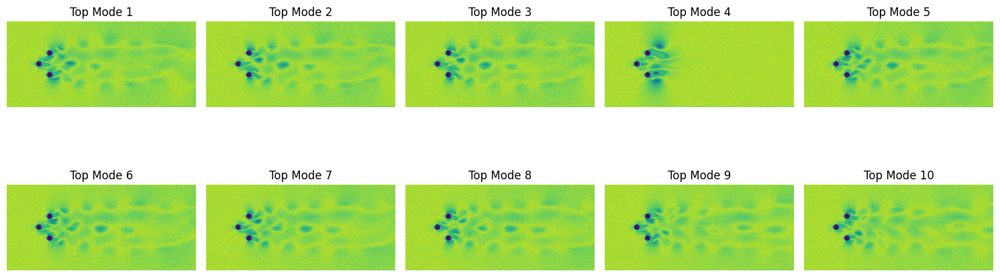

In [ ]:
import matplotlib.pyplot as plt

# Plot the top 10 reconstructed images
plt.figure(figsize=(15, 6))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(reconstructed_images[i].reshape(image_array[0].shape), cmap=None)
    plt.title(f"Top Mode {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
from PIL import Image
import numpy as np
import os

def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        if os.path.isfile(img_path):
            try:
                img = Image.open(img_path)
                img_gray = img.convert('L')
                img_array = np.array(img_gray)
                images.append(img_array)
            except:
                print(f"Failed to load image: {img_path}")
    return images

folder_path = "/content/drive/MyDrive/Fluid Proj/New_Noise_Gaussian_80"
image_array = load_images_from_folder(folder_path)

In [ ]:
import numpy as np
import cv2
import os

def read_images(folder):
    images = []
    for filename in sorted(os.listdir(folder)):
        img = cv2.imread(os.path.join(folder, filename), cv2.IMREAD_GRAYSCALE)
        if img is not None:
            images.append(img.flatten())
    return np.array(images)

def compute_mean(images):
    return np.mean(images, axis=0)

def compute_fluctuation_matrix(images, mean_image):
    return images - mean_image

def perform_svd(fluctuation_matrix):
    U, S, Vt = np.linalg.svd(fluctuation_matrix, full_matrices=False)
    return U, S, Vt



images_folder = '/content/drive/MyDrive/Fluid Proj/New_Noise_Gaussian_80'
batch_size = 100
modes = 10

images = read_images(images_folder)

mean_image = compute_mean(images)

num_batches = len(images) // batch_size + 1
for batch_idx in range(num_batches):
    start_idx = batch_idx * batch_size
    end_idx = min((batch_idx + 1) * batch_size, len(images))
    batch_images = images[start_idx:end_idx]

    if len(batch_images) == 0:
        break

    fluctuation_matrix = compute_fluctuation_matrix(batch_images, mean_image)

    U, S, Vt = perform_svd(fluctuation_matrix)


print("Printing top 10 energy states modes completed!")

Printing top 10 energy states modes completed!


In [ ]:
def reconstruct_images(U, S, Vt, modes):
    reconstructed_images  = U @ S @ Vt + compute_mean(images)
    return reconstructed_images

In [ ]:
S_new = np.zeros((100,100))
np.fill_diagonal(S_new, S)
reconstructed_images = reconstruct_images(U, S_new, Vt, modes)

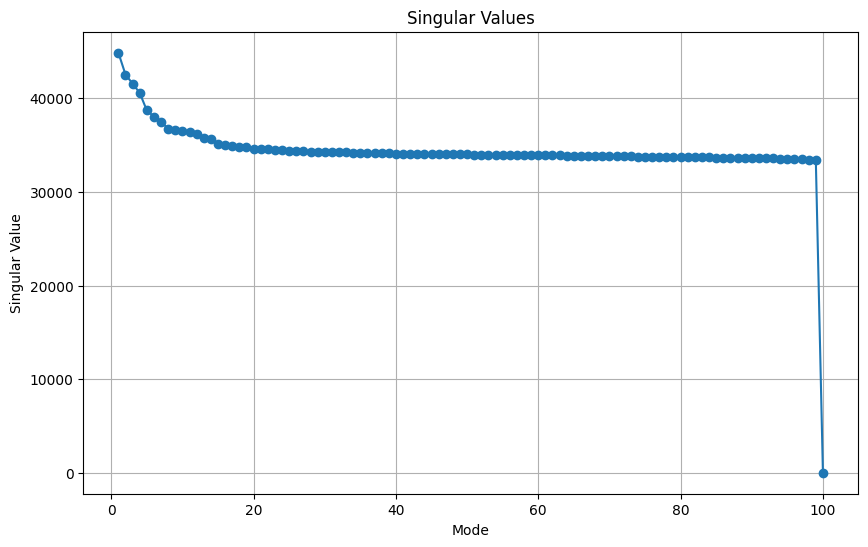

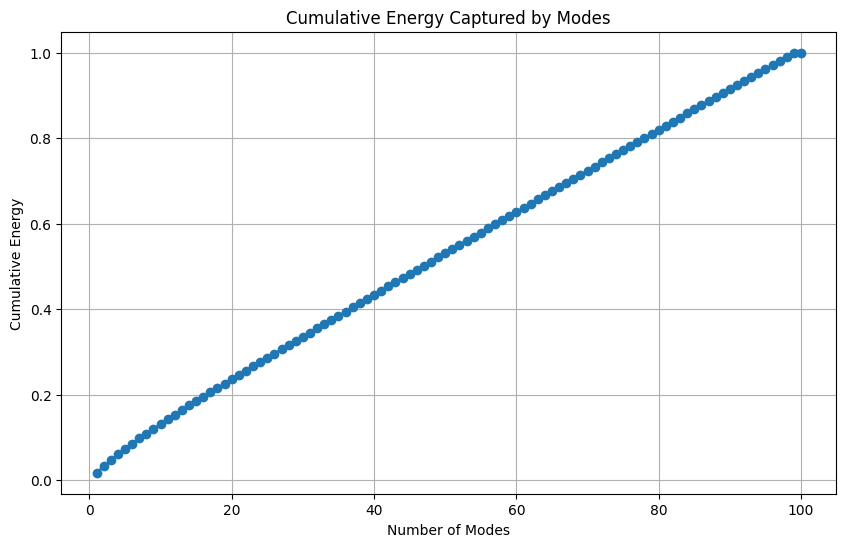

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

singular_values = S

plt.figure(figsize=(10, 6))
plt.plot(np.arange(1, len(singular_values) + 1), singular_values, marker='o', linestyle='-')
plt.title('Singular Values')
plt.xlabel('Mode')
plt.ylabel('Singular Value')
plt.grid(True)
plt.show()

cumulative_energy = np.cumsum(singular_values ** 2 / np.sum(singular_values ** 2))

plt.figure(figsize=(10, 6))
plt.plot(np.arange(1, len(cumulative_energy) + 1), cumulative_energy, marker='o', linestyle='-')
plt.title('Cumulative Energy Captured by Modes')
plt.xlabel('Number of Modes')
plt.ylabel('Cumulative Energy')
plt.grid(True)
plt.show()

top_modes_indices = np.argsort(singular_values)[::-1][:10]
top_modes_energy = singular_values

In [ ]:
print("Top 10 energy states (modes):")
for mode, energy in zip(top_modes_indices, top_modes_energy):
    print(f"Mode {mode + 1}: Energy = {round(energy,4)}")

Top 10 energy states (modes):
Mode 1: Energy = 44868.6461
Mode 2: Energy = 42537.185
Mode 3: Energy = 41564.7551
Mode 4: Energy = 40572.1366
Mode 5: Energy = 38699.9163
Mode 6: Energy = 38045.742
Mode 7: Energy = 37463.8423
Mode 8: Energy = 36767.7946
Mode 9: Energy = 36607.5204
Mode 10: Energy = 36464.9785


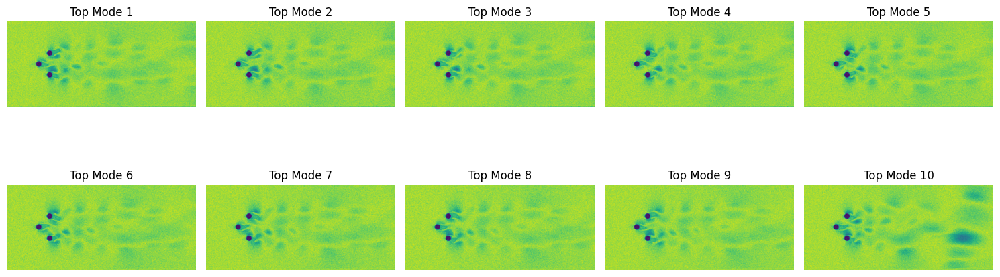

In [ ]:
import matplotlib.pyplot as plt

# Plot the top 10 reconstructed images
plt.figure(figsize=(15, 6))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(reconstructed_images[i].reshape(image_array[0].shape), cmap=None)
    plt.title(f"Top Mode {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import cv2
import os

def read_images(folder):
    images = []
    for filename in sorted(os.listdir(folder)):
        img = cv2.imread(os.path.join(folder, filename), cv2.IMREAD_GRAYSCALE)
        if img is not None:
            images.append(img)
    return images



def add_speckle_noise(image, magnitude):
    noise = magnitude * np.random.randn(*image.shape)
    noisy_image = image + image * noise
    noisy_image = np.clip(noisy_image, 0, 255).astype(np.uint8)
    return noisy_image

images_folder = '/content/drive/MyDrive/Fluid Proj/Imagestack2'
output_folder = '/content/drive/MyDrive/Fluid Proj/Noisy_Images_speckle'

original_images = read_images(images_folder)

noise_magnitudes = [0.2, 0.4, 0.6, 0.8]
noise_types = ['Speckle']

for noise_type in noise_types:
    for magnitude in noise_magnitudes:
        for idx, image in enumerate(original_images):
            if noise_type == 'Speckle':
                noisy_image = add_speckle_noise(image, magnitude)

            output_filename = f'{noise_type}_Noise_{int(magnitude*100)}_{idx+1}.png'
            cv2.imwrite(os.path.join(output_folder, output_filename), noisy_image)

print("Noise addition completed!")


In [ ]:
from PIL import Image
import numpy as np
import os

def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        if os.path.isfile(img_path):
            try:
                img = Image.open(img_path)
                img_gray = img.convert('L')
                img_array = np.array(img_gray)
                images.append(img_array)
            except:
                print(f"Failed to load image: {img_path}")
    return images

folder_path = "/content/drive/MyDrive/Fluid Proj/New_Noise_Spackle_20"
image_array = load_images_from_folder(folder_path)

In [ ]:
import numpy as np
import cv2
import os

def read_images(folder):
    images = []
    for filename in sorted(os.listdir(folder)):
        img = cv2.imread(os.path.join(folder, filename), cv2.IMREAD_GRAYSCALE)
        if img is not None:
            images.append(img.flatten())
    return np.array(images)

def compute_mean(images):
    return np.mean(images, axis=0)

def compute_fluctuation_matrix(images, mean_image):
    return images - mean_image

def perform_svd(fluctuation_matrix):
    U, S, Vt = np.linalg.svd(fluctuation_matrix, full_matrices=False)
    return U, S, Vt



images_folder = '/content/drive/MyDrive/Fluid Proj/New_Noise_Spackle_20'
batch_size = 100
modes = 10

images = read_images(images_folder)

mean_image = compute_mean(images)

num_batches = len(images) // batch_size + 1
for batch_idx in range(num_batches):
    start_idx = batch_idx * batch_size
    end_idx = min((batch_idx + 1) * batch_size, len(images))
    batch_images = images[start_idx:end_idx]

    if len(batch_images) == 0:
        break

    fluctuation_matrix = compute_fluctuation_matrix(batch_images, mean_image)

    U, S, Vt = perform_svd(fluctuation_matrix)


print("Printing top 10 energy states modes completed!")

Printing top 10 energy states modes completed!


In [ ]:
def reconstruct_images(U, S, Vt, modes):
    reconstructed_images  = U @ S @ Vt + compute_mean(images)
    return reconstructed_images

In [ ]:
S_new = np.zeros((100,100))
np.fill_diagonal(S_new, S)
reconstructed_images = reconstruct_images(U, S_new, Vt, modes)

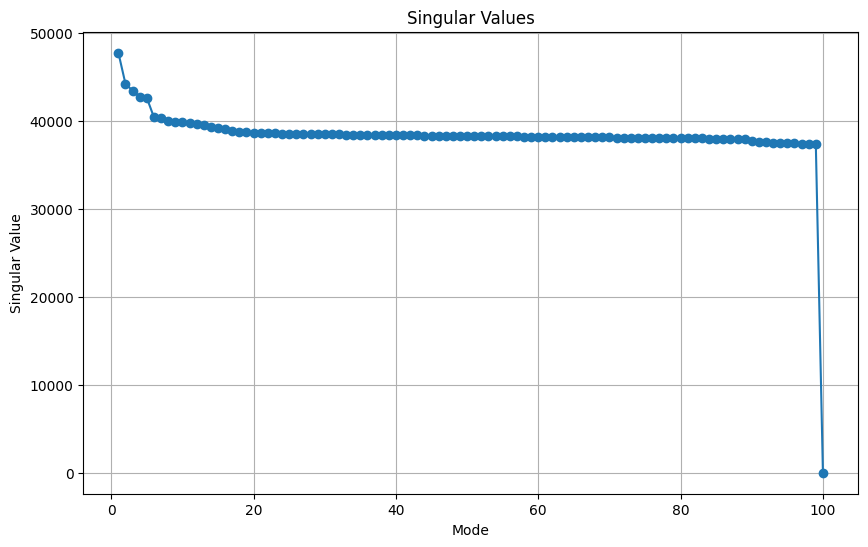

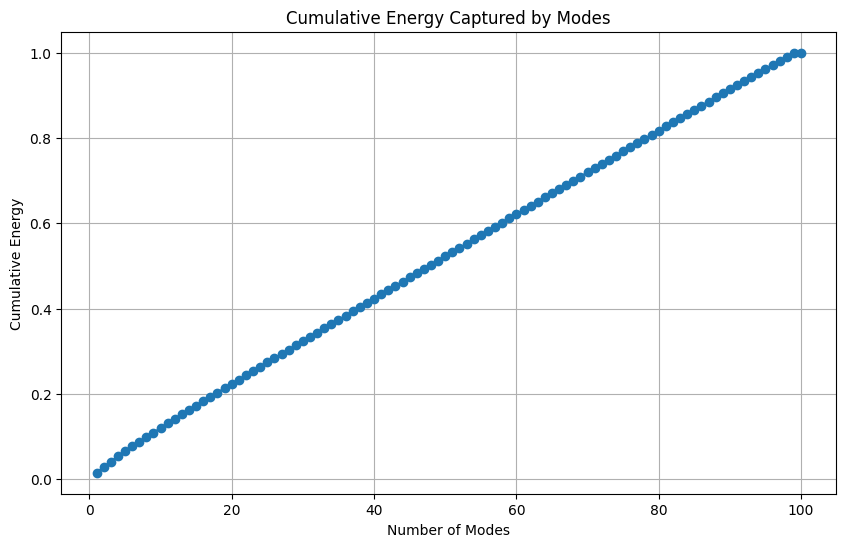

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

singular_values = S

plt.figure(figsize=(10, 6))
plt.plot(np.arange(1, len(singular_values) + 1), singular_values, marker='o', linestyle='-')
plt.title('Singular Values')
plt.xlabel('Mode')
plt.ylabel('Singular Value')
plt.grid(True)
plt.show()

cumulative_energy = np.cumsum(singular_values ** 2 / np.sum(singular_values ** 2))

plt.figure(figsize=(10, 6))
plt.plot(np.arange(1, len(cumulative_energy) + 1), cumulative_energy, marker='o', linestyle='-')
plt.title('Cumulative Energy Captured by Modes')
plt.xlabel('Number of Modes')
plt.ylabel('Cumulative Energy')
plt.grid(True)
plt.show()

top_modes_indices = np.argsort(singular_values)[::-1][:10]
top_modes_energy = singular_values

In [ ]:
print("Top 10 energy states (modes):")
for mode, energy in zip(top_modes_indices, top_modes_energy):
    print(f"Mode {mode + 1}: Energy = {round(energy,4)}")

Top 10 energy states (modes):
Mode 1: Energy = 47710.117
Mode 2: Energy = 44159.85
Mode 3: Energy = 43413.3084
Mode 4: Energy = 42714.434
Mode 5: Energy = 42566.749
Mode 6: Energy = 40375.0691
Mode 7: Energy = 40279.347
Mode 8: Energy = 39986.6387
Mode 9: Energy = 39876.2008
Mode 10: Energy = 39814.192


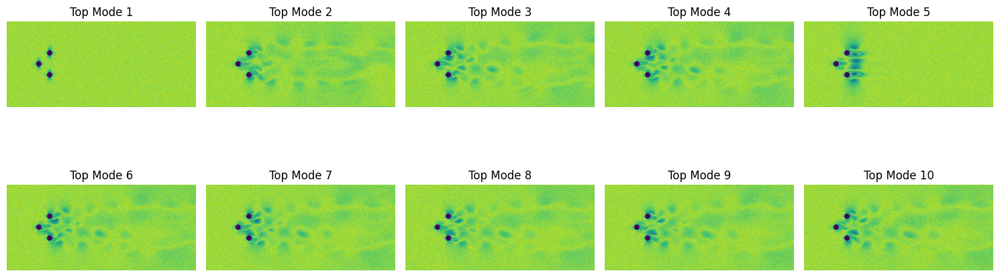

In [ ]:
import matplotlib.pyplot as plt

# Plot the top 10 reconstructed images
plt.figure(figsize=(15, 6))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(reconstructed_images[i].reshape(image_array[0].shape), cmap=None)
    plt.title(f"Top Mode {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
from PIL import Image
import numpy as np
import os

def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        if os.path.isfile(img_path):
            try:
                img = Image.open(img_path)
                img_gray = img.convert('L')
                img_array = np.array(img_gray)
                images.append(img_array)
            except:
                print(f"Failed to load image: {img_path}")
    return images

folder_path = "/content/drive/MyDrive/Fluid Proj/new_speckle_40"
image_array = load_images_from_folder(folder_path)

In [ ]:
import numpy as np
import cv2
import os

def read_images(folder):
    images = []
    for filename in sorted(os.listdir(folder)):
        img = cv2.imread(os.path.join(folder, filename), cv2.IMREAD_GRAYSCALE)
        if img is not None:
            images.append(img.flatten())
    return np.array(images)

def compute_mean(images):
    return np.mean(images, axis=0)

def compute_fluctuation_matrix(images, mean_image):
    return images - mean_image

def perform_svd(fluctuation_matrix):
    U, S, Vt = np.linalg.svd(fluctuation_matrix, full_matrices=False)
    return U, S, Vt



images_folder = '/content/drive/MyDrive/Fluid Proj/new_speckle_40'
batch_size = 100
modes = 10

images = read_images(images_folder)

mean_image = compute_mean(images)

num_batches = len(images) // batch_size + 1
for batch_idx in range(num_batches):
    start_idx = batch_idx * batch_size
    end_idx = min((batch_idx + 1) * batch_size, len(images))
    batch_images = images[start_idx:end_idx]

    if len(batch_images) == 0:
        break

    fluctuation_matrix = compute_fluctuation_matrix(batch_images, mean_image)

    U, S, Vt = perform_svd(fluctuation_matrix)


print("Printing top 10 energy states modes completed!")

Printing top 10 energy states modes completed!


In [ ]:
def reconstruct_images(U, S, Vt, modes):
    reconstructed_images  = U @ S @ Vt + compute_mean(images)
    return reconstructed_images

In [ ]:
S_new = np.zeros((100,100))
np.fill_diagonal(S_new, S)
reconstructed_images = reconstruct_images(U, S_new, Vt, modes)

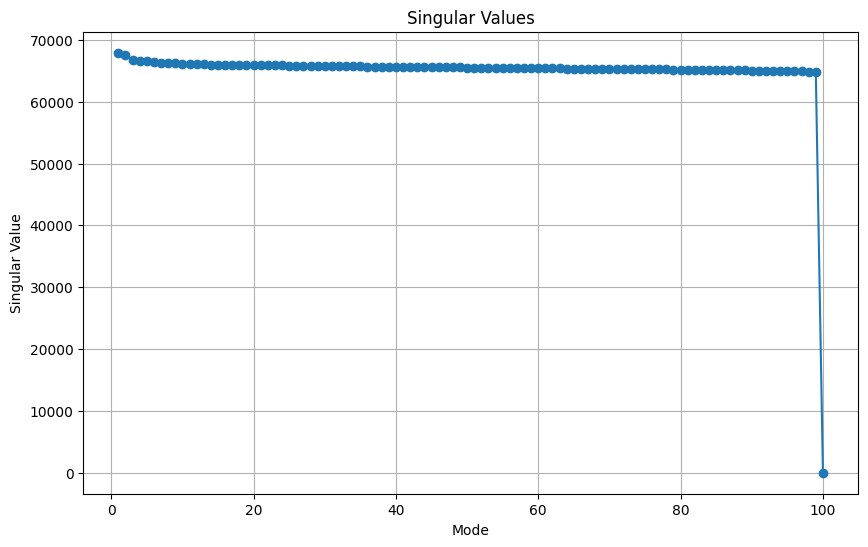

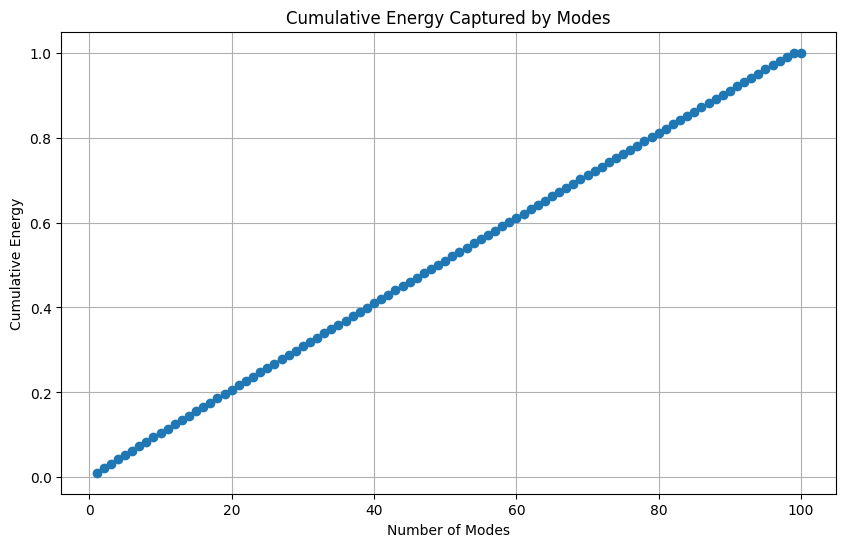

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

singular_values = S

plt.figure(figsize=(10, 6))
plt.plot(np.arange(1, len(singular_values) + 1), singular_values, marker='o', linestyle='-')
plt.title('Singular Values')
plt.xlabel('Mode')
plt.ylabel('Singular Value')
plt.grid(True)
plt.show()

cumulative_energy = np.cumsum(singular_values ** 2 / np.sum(singular_values ** 2))

plt.figure(figsize=(10, 6))
plt.plot(np.arange(1, len(cumulative_energy) + 1), cumulative_energy, marker='o', linestyle='-')
plt.title('Cumulative Energy Captured by Modes')
plt.xlabel('Number of Modes')
plt.ylabel('Cumulative Energy')
plt.grid(True)
plt.show()

top_modes_indices = np.argsort(singular_values)[::-1][:10]
top_modes_energy = singular_values

In [ ]:
print("Top 10 energy states (modes):")
for mode, energy in zip(top_modes_indices, top_modes_energy):
    print(f"Mode {mode + 1}: Energy = {round(energy,4)}")

Top 10 energy states (modes):
Mode 1: Energy = 67922.697
Mode 2: Energy = 67541.9022
Mode 3: Energy = 66737.8667
Mode 4: Energy = 66524.856
Mode 5: Energy = 66514.4032
Mode 6: Energy = 66433.5123
Mode 7: Energy = 66298.5477
Mode 8: Energy = 66273.9282
Mode 9: Energy = 66231.452
Mode 10: Energy = 66117.6481


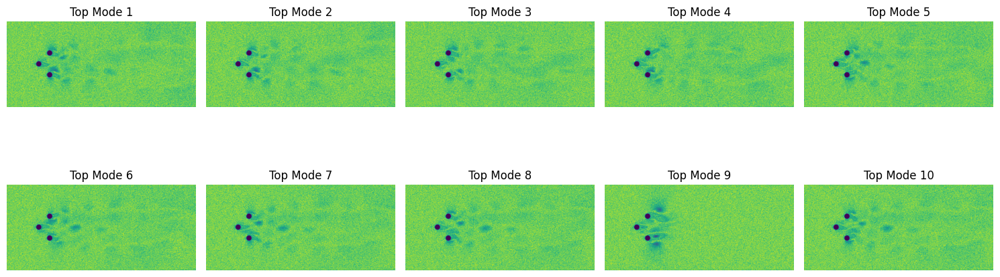

In [ ]:
import matplotlib.pyplot as plt

# Plot the top 10 reconstructed images
plt.figure(figsize=(15, 6))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(reconstructed_images[i].reshape(image_array[0].shape), cmap=None)
    plt.title(f"Top Mode {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
from PIL import Image
import numpy as np
import os

def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        if os.path.isfile(img_path):
            try:
                img = Image.open(img_path)
                img_gray = img.convert('L')
                img_array = np.array(img_gray)
                images.append(img_array)
            except:
                print(f"Failed to load image: {img_path}")
    return images

folder_path = "/content/drive/MyDrive/Fluid Proj/new_speckle_60"
image_array = load_images_from_folder(folder_path)

In [ ]:
import numpy as np
import cv2
import os

def read_images(folder):
    images = []
    for filename in sorted(os.listdir(folder)):
        img = cv2.imread(os.path.join(folder, filename), cv2.IMREAD_GRAYSCALE)
        if img is not None:
            images.append(img.flatten())
    return np.array(images)

def compute_mean(images):
    return np.mean(images, axis=0)

def compute_fluctuation_matrix(images, mean_image):
    return images - mean_image

def perform_svd(fluctuation_matrix):
    U, S, Vt = np.linalg.svd(fluctuation_matrix, full_matrices=False)
    return U, S, Vt



images_folder = '/content/drive/MyDrive/Fluid Proj/new_speckle_60'
batch_size = 100
modes = 10

images = read_images(images_folder)

mean_image = compute_mean(images)

num_batches = len(images) // batch_size + 1
for batch_idx in range(num_batches):
    start_idx = batch_idx * batch_size
    end_idx = min((batch_idx + 1) * batch_size, len(images))
    batch_images = images[start_idx:end_idx]

    if len(batch_images) == 0:
        break

    fluctuation_matrix = compute_fluctuation_matrix(batch_images, mean_image)

    U, S, Vt = perform_svd(fluctuation_matrix)


print("Printing top 10 energy states modes completed!")

Printing top 10 energy states modes completed!


In [ ]:
def reconstruct_images(U, S, Vt, modes):
    reconstructed_images  = U @ S @ Vt + compute_mean(images)
    return reconstructed_images

In [ ]:
S_new = np.zeros((100,100))
np.fill_diagonal(S_new, S)
reconstructed_images = reconstruct_images(U, S_new, Vt, modes)

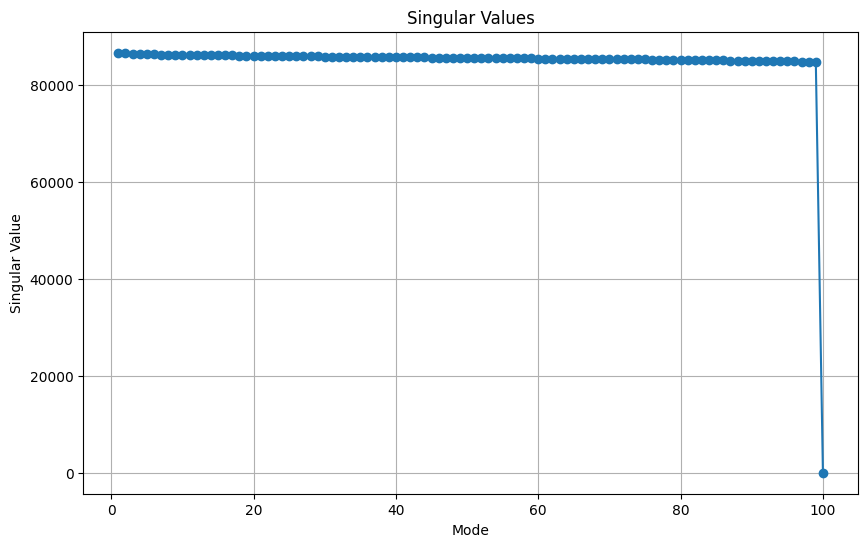

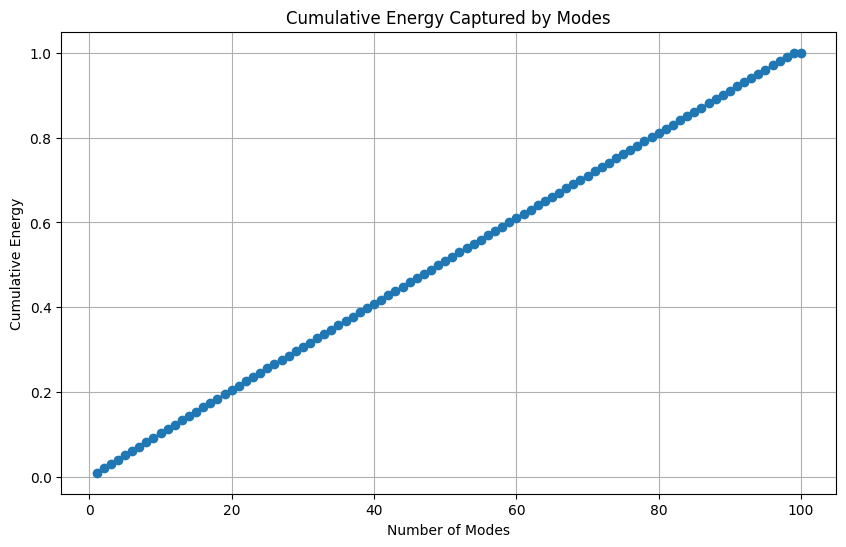

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

singular_values = S

plt.figure(figsize=(10, 6))
plt.plot(np.arange(1, len(singular_values) + 1), singular_values, marker='o', linestyle='-')
plt.title('Singular Values')
plt.xlabel('Mode')
plt.ylabel('Singular Value')
plt.grid(True)
plt.show()

cumulative_energy = np.cumsum(singular_values ** 2 / np.sum(singular_values ** 2))

plt.figure(figsize=(10, 6))
plt.plot(np.arange(1, len(cumulative_energy) + 1), cumulative_energy, marker='o', linestyle='-')
plt.title('Cumulative Energy Captured by Modes')
plt.xlabel('Number of Modes')
plt.ylabel('Cumulative Energy')
plt.grid(True)
plt.show()

top_modes_indices = np.argsort(singular_values)[::-1][:10]
top_modes_energy = singular_values

In [ ]:
print("Top 10 energy states (modes):")
for mode, energy in zip(top_modes_indices, top_modes_energy):
    print(f"Mode {mode + 1}: Energy = {round(energy,4)}")

Top 10 energy states (modes):
Mode 1: Energy = 86664.9165
Mode 2: Energy = 86570.2713
Mode 3: Energy = 86480.1969
Mode 4: Energy = 86383.6132
Mode 5: Energy = 86365.8353
Mode 6: Energy = 86301.5421
Mode 7: Energy = 86283.6961
Mode 8: Energy = 86269.9715
Mode 9: Energy = 86264.9824
Mode 10: Energy = 86242.2


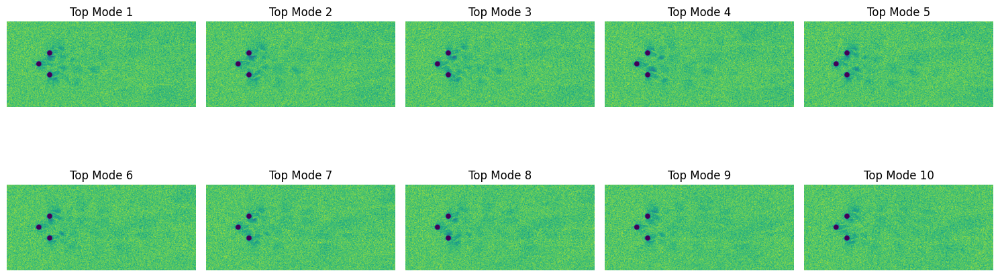

In [ ]:
import matplotlib.pyplot as plt

# Plot the top 10 reconstructed images
plt.figure(figsize=(15, 6))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(reconstructed_images[i].reshape(image_array[0].shape), cmap=None)
    plt.title(f"Top Mode {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
from PIL import Image
import numpy as np
import os

def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        if os.path.isfile(img_path):
            try:
                img = Image.open(img_path)
                img_gray = img.convert('L')
                img_array = np.array(img_gray)
                images.append(img_array)
            except:
                print(f"Failed to load image: {img_path}")
    return images

folder_path = "/content/drive/MyDrive/Fluid Proj/new_speckle_80"
image_array = load_images_from_folder(folder_path)



In [ ]:
import numpy as np
import cv2
import os

def read_images(folder):
    images = []
    for filename in sorted(os.listdir(folder)):
        img = cv2.imread(os.path.join(folder, filename), cv2.IMREAD_GRAYSCALE)
        if img is not None:
            images.append(img.flatten())
    return np.array(images)

def compute_mean(images):
    return np.mean(images, axis=0)

def compute_fluctuation_matrix(images, mean_image):
    return images - mean_image

def perform_svd(fluctuation_matrix):
    U, S, Vt = np.linalg.svd(fluctuation_matrix, full_matrices=False)
    return U, S, Vt



images_folder = '/content/drive/MyDrive/Fluid Proj/new_speckle_80'
batch_size = 100
modes = 10

images = read_images(images_folder)

mean_image = compute_mean(images)

num_batches = len(images) // batch_size + 1
for batch_idx in range(num_batches):
    start_idx = batch_idx * batch_size
    end_idx = min((batch_idx + 1) * batch_size, len(images))
    batch_images = images[start_idx:end_idx]

    if len(batch_images) == 0:
        break

    fluctuation_matrix = compute_fluctuation_matrix(batch_images, mean_image)

    U, S, Vt = perform_svd(fluctuation_matrix)


In [ ]:
def reconstruct_images(U, S, Vt, modes):
    reconstructed_images  = U @ S @ Vt + compute_mean(images)
    return reconstructed_images

In [ ]:
    S_new = np.zeros((100,100))
    np.fill_diagonal(S_new, S)
    reconstructed_images = reconstruct_images(U, S_new, Vt, modes)

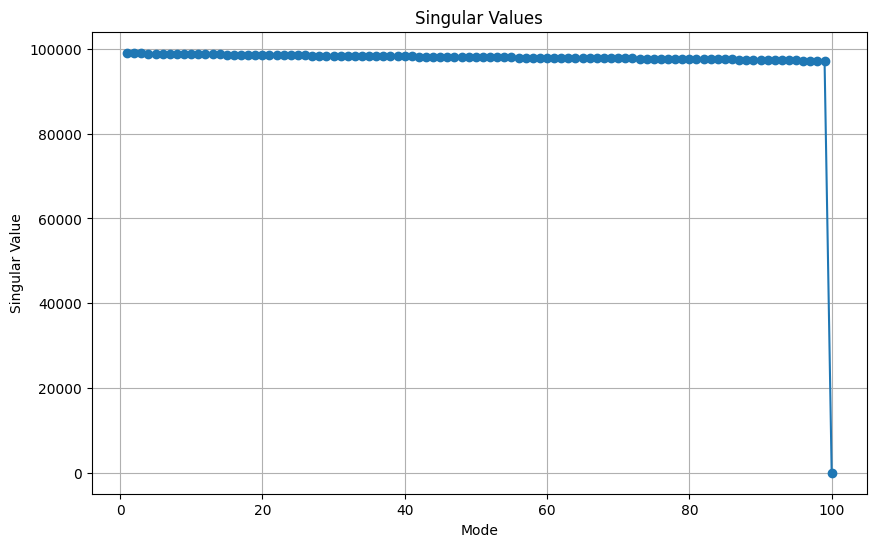

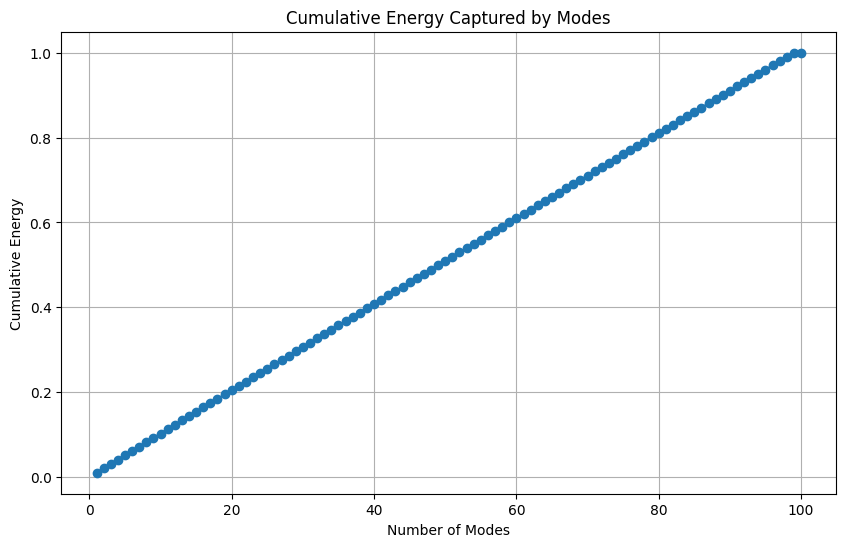

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

singular_values = S

plt.figure(figsize=(10, 6))
plt.plot(np.arange(1, len(singular_values) + 1), singular_values, marker='o', linestyle='-')
plt.title('Singular Values')
plt.xlabel('Mode')
plt.ylabel('Singular Value')
plt.grid(True)
plt.show()

cumulative_energy = np.cumsum(singular_values ** 2 / np.sum(singular_values ** 2))

plt.figure(figsize=(10, 6))
plt.plot(np.arange(1, len(cumulative_energy) + 1), cumulative_energy, marker='o', linestyle='-')
plt.title('Cumulative Energy Captured by Modes')
plt.xlabel('Number of Modes')
plt.ylabel('Cumulative Energy')
plt.grid(True)
plt.show()

top_modes_indices = np.argsort(singular_values)[::-1][:10]
top_modes_energy = singular_values


In [ ]:
print("Top 10 energy states (modes):")
for mode, energy in zip(top_modes_indices, top_modes_energy):
    print(f"Mode {mode + 1}: Energy = {round(energy,4)}")

Top 10 energy states (modes):
Mode 1: Energy = 99125.7156
Mode 2: Energy = 99034.5512
Mode 3: Energy = 99003.1399
Mode 4: Energy = 98920.9073
Mode 5: Energy = 98897.6463
Mode 6: Energy = 98883.8169
Mode 7: Energy = 98858.4898
Mode 8: Energy = 98848.5447
Mode 9: Energy = 98832.5215
Mode 10: Energy = 98813.2009


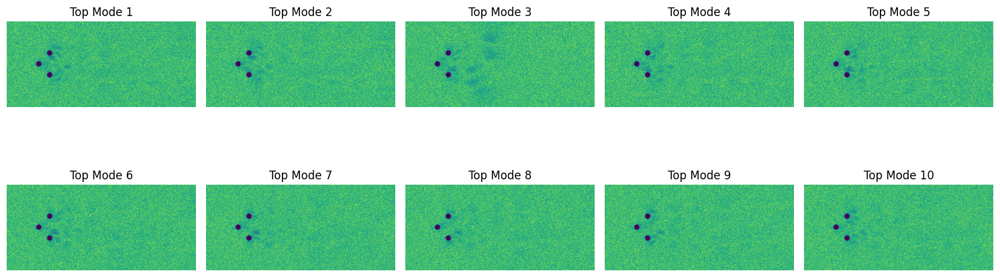

In [ ]:
import matplotlib.pyplot as plt

# Plot the top 10 reconstructed images
plt.figure(figsize=(15, 6))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(reconstructed_images[i].reshape(image_array[0].shape), cmap=None)
    plt.title(f"Top Mode {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

1/1 [==============================] - 0s 79ms/step


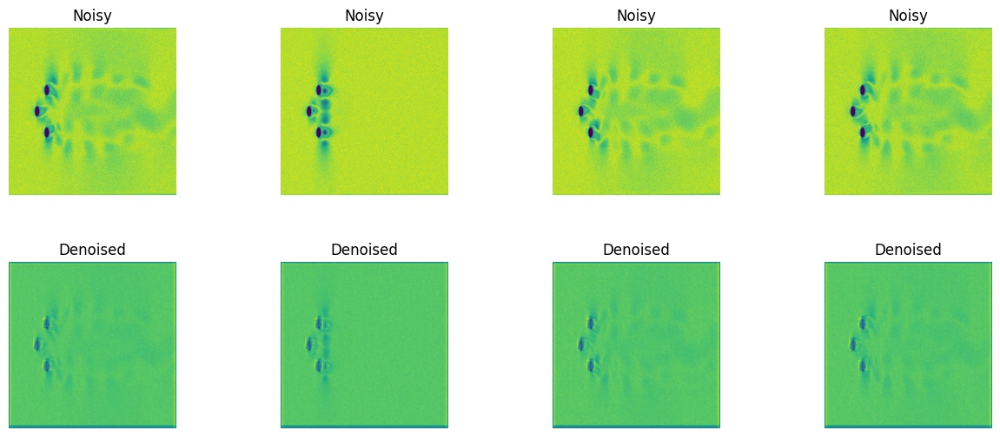

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras import layers, models

def autoencoder(input_shape):
    inputs = layers.Input(shape=input_shape)
    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)
    x = layers.Conv2DTranspose(32, (3, 3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2, 2))(x)
    outputs = layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)
    model = models.Model(inputs=inputs, outputs=outputs)
    return model

def load_images_from_folder(folder_path, target_size=(256, 256)):
    images = []
    for filename in os.listdir(folder_path):
        img_path = os.path.join(folder_path, filename)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, target_size)
        img = img.astype('float32') / 255.0
        img = img[..., np.newaxis]
        images.append(img)
    return np.array(images)

def denoise_images(model, noisy_images):
    denoised_images = []
    for noisy_image in noisy_images:
        denoised_image = model.predict(np.expand_dims(noisy_image, axis=0))
        denoised_images.append(denoised_image.squeeze())
    return denoised_images

input_folder = '/content/drive/MyDrive/Fluid Proj/New_Noise_Gaussian'

noisy_images = load_images_from_folder(input_folder)

input_shape = noisy_images[0].shape
model = autoencoder(input_shape)


denoised_images = denoise_images(model, noisy_images)

num_images = min(len(noisy_images), 4)
plt.figure(figsize=(15, 6))

for i in range(num_images):
    plt.subplot(2, num_images, i + 1)
    plt.imshow(noisy_images[i][:, :, 0], cmap=None)
    plt.title('Noisy')
    plt.axis('off')

    plt.subplot(2, num_images, num_images + i + 1)
    plt.imshow(denoised_images[i], cmap=None)
    plt.title('Denoised')
    plt.axis('off')

plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.show()

1/1 [==============================] - 0s 93ms/step


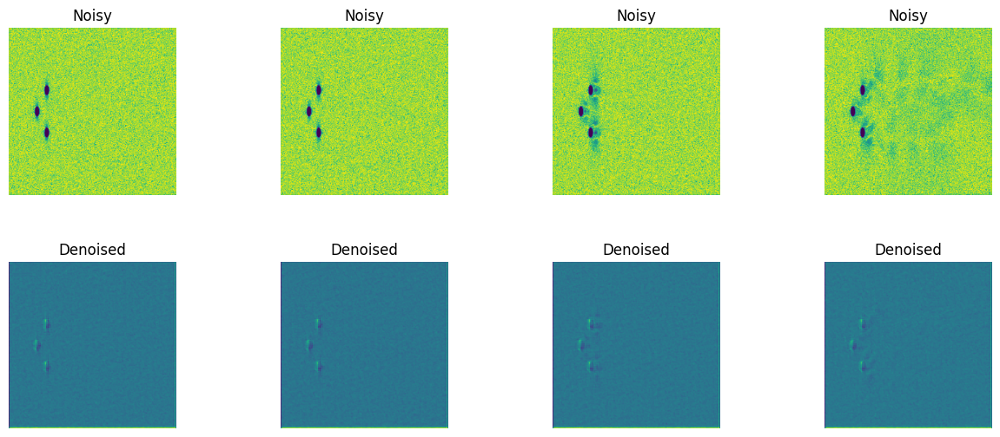

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras import layers, models

def autoencoder(input_shape):
    inputs = layers.Input(shape=input_shape)
    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)
    x = layers.Conv2DTranspose(32, (3, 3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2, 2))(x)
    outputs = layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)
    model = models.Model(inputs=inputs, outputs=outputs)
    return model

def load_images_from_folder(folder_path, target_size=(256, 256)):
    images = []
    for filename in os.listdir(folder_path):
        img_path = os.path.join(folder_path, filename)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, target_size)
        img = img.astype('float32') / 255.0
        img = img[..., np.newaxis]
        images.append(img)
    return np.array(images)

def denoise_images(model, noisy_images):
    denoised_images = []
    for noisy_image in noisy_images:
        denoised_image = model.predict(np.expand_dims(noisy_image, axis=0))
        denoised_images.append(denoised_image.squeeze())
    return denoised_images

input_folder = '/content/drive/MyDrive/Fluid Proj/New_Noise_Spackle'

noisy_images = load_images_from_folder(input_folder)

input_shape = noisy_images[0].shape
model = autoencoder(input_shape)


denoised_images = denoise_images(model, noisy_images)

num_images = min(len(noisy_images), 4)
plt.figure(figsize=(15, 6))

for i in range(num_images):
    plt.subplot(2, num_images, i + 1)
    plt.imshow(noisy_images[i][:, :, 0], cmap=None)
    plt.title('Noisy')
    plt.axis('off')

    plt.subplot(2, num_images, num_images + i + 1)
    plt.imshow(denoised_images[i], cmap=None)
    plt.title('Denoised')
    plt.axis('off')

plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.show()